Download Data

In [2]:
import utils

utils.download_data()
compositions, uc_params, imgdata = utils.parse_files()
SBFO_data = utils.process_data(compositions, uc_params, imgdata)

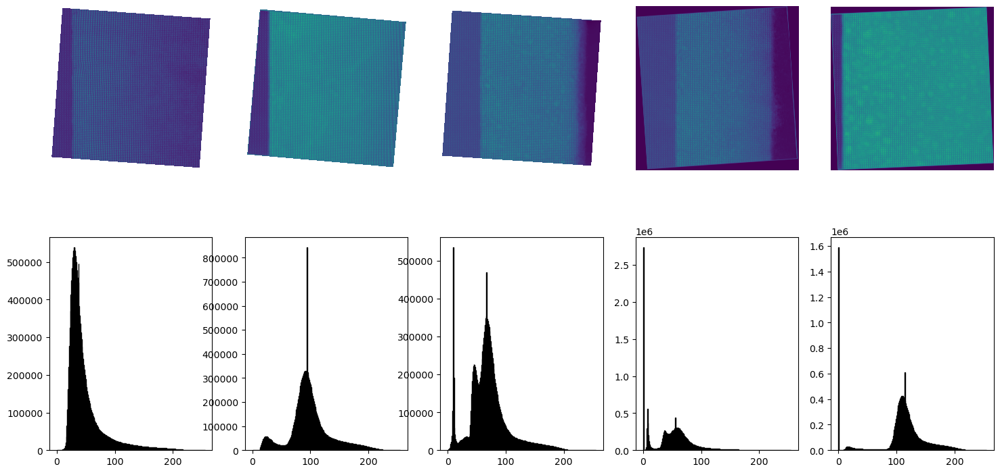

In [3]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
# import mlx.core as np

target = Path('sample_imgs')
target.mkdir(exist_ok=True)

fig, axes = plt.subplots(2,len(SBFO_data), figsize=(18,9))
for i, (im, ax, ax2) in enumerate(zip(SBFO_data, axes[0], axes[1])):
    ax.imshow(im['image'])
    ax.set_axis_off()
    
    # Image histogram
    ax2.hist(im['image'][:].ravel(), bins=256, range=(0, 255), fc='k', ec='k')

    if not (target / f"sample_{i}.png").exists():
        img = Image.fromarray(im['image'][:])
        img = img.convert("L")  # Convert to grayscale
        img.save(target / f"sample_{i}.png")

Number of regions with size >= 200: 1
Number of regions with size >= 200: 16


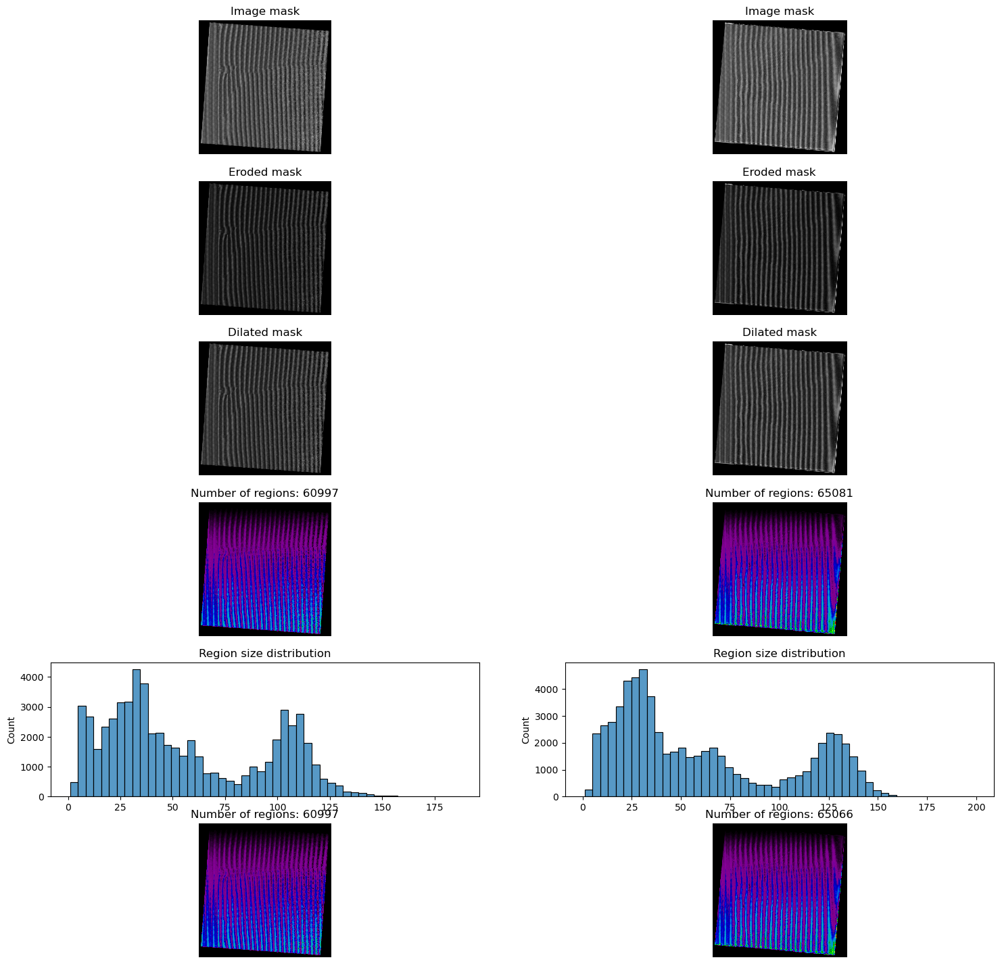

In [4]:
from skimage.morphology import binary_erosion, binary_dilation, disk
import numpy as np
from skimage.filters import threshold_local
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage import img_as_ubyte
import seaborn as sns
from scipy import ndimage as ndi
import matplotlib as mpl

images = {}

fig, axes = plt.subplots(6,len(SBFO_data[:2]), figsize=(18,18))
for i, (im, (ax, ax2, ax3, ax4, ax5, ax6)) in enumerate(zip(SBFO_data[:2], axes.T)):
    data = {}
    thresh = threshold_local(im['image'][:], block_size=31, method='gaussian', offset=0)
    binary = im['image'] > thresh
    data['binary'] = binary

    # Plotting
    ax.imshow(binary, cmap='gray')
    ax.set_axis_off()
    ax.set_title("Image mask")

    img = Image.fromarray(img_as_ubyte(binary))
    img.save(target / f"sample_{i}_binary.png")

    eroded = binary_erosion(binary, disk(2))
    data['eroded'] = eroded

    # Plotting
    ax2.imshow(eroded, cmap='gray')
    ax2.set_axis_off()
    ax2.set_title("Eroded mask")

    img = Image.fromarray(img_as_ubyte(eroded))
    img.save(target / f"sample_{i}_eroded.png")
    
    dilated = binary_dilation(eroded, disk(1))
    data['dilated'] = dilated

    img = Image.fromarray(img_as_ubyte(dilated))
    img.save(target / f"sample_{i}_dilated.png")

    # Plotting
    ax3.imshow(dilated, cmap='gray')
    ax3.set_axis_off()
    ax3.set_title("Dilated mask")

    # Perform watershed segmentation
    distance = ndi.distance_transform_edt(dilated)
    coords = peak_local_max(distance, footprint=np.ones((3, 3)), labels=eroded)
    mask = np.zeros(distance.shape, dtype=bool)
    mask[tuple(coords.T)] = True
    markers, _ = ndi.label(mask)
    labels = watershed(-distance, markers, mask=distance)
    data['clf'] = labels

    # Plotting
    ax4.imshow(labels, cmap='nipy_spectral')
    ax4.set_axis_off()
    ax4.set_title(f"Number of regions: {len(np.unique(labels))}")

    cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(labels))))
    colored_labels = np.array([cm[label] for label in labels])
    colored_labels = (colored_labels * 255).astype(np.uint8)  # Convert to uint8
    
    img = Image.fromarray(colored_labels)
    img.save(target / f"sample_{i}_clf.png")

    # Count number of elements in each class
    cutoff = 200
    sizes = np.bincount(labels.ravel())
    class_sizes = dict(zip(np.unique(labels), sizes))
    # Remove anything bigger than set number of pixels
    class_sizes = {k: v for k, v in class_sizes.items() if v < cutoff}
    num_greater = len(sizes[sizes >= cutoff])
    sizes = np.array(list(class_sizes.values()))
    print(f"Number of regions with size >= {cutoff}: {num_greater}")

    # Plotting
    sns.histplot(sizes, bins=50, ax=ax5)
    ax5.set_title("Region size distribution")

    
    pruned_labels = labels.copy()
    pruned_labels[~np.isin(labels, list(class_sizes.keys()))] = 0
    data['pruned'] = pruned_labels

    # Plotting
    ax6.imshow(pruned_labels, cmap='nipy_spectral')
    ax6.set_axis_off()
    ax6.set_title(f"Number of regions: {len(np.unique(pruned_labels))}")

    colored_pruned_labels = np.array([cm[label] for label in pruned_labels])
    colored_pruned_labels = (colored_pruned_labels * 255).astype(np.uint8)
    img = Image.fromarray(colored_pruned_labels)
    img.save(target / f"sample_{i}_clf_pruned.png")
    
    images[i] = data

In [5]:
import polars as pl
import numba
# Use dispersion of the region sizes to determine outliers

# Numba Optimized
def numba_class_stats(data):
    @numba.njit(fastmath=True, parallel=True)
    def get_stats(data):
        all_outputs = np.zeros((len(np.unique(data)) - 1, 6))
        classes = np.unique(data)[1:]
        for ind in numba.prange(classes.size):
            c = classes[ind]
            x, y = np.where(c == data)
            all_outputs[ind] = [c, x.size, np.median(x), np.median(y), np.std(x), np.std(y)]
        return all_outputs

    output_np = get_stats(data)
    cols_dtypes = {
        'class': pl.UInt32, 
        'size': pl.UInt32, 
        'median_x': pl.UInt32, 
        'median_y': pl.UInt32, 
        'std_x': pl.Float32, 
        'std_y': pl.Float32
    }
    output = pl.DataFrame(output_np, schema=cols_dtypes)    
    return output

In [6]:
class_data = numba_class_stats(images[0]['pruned'])

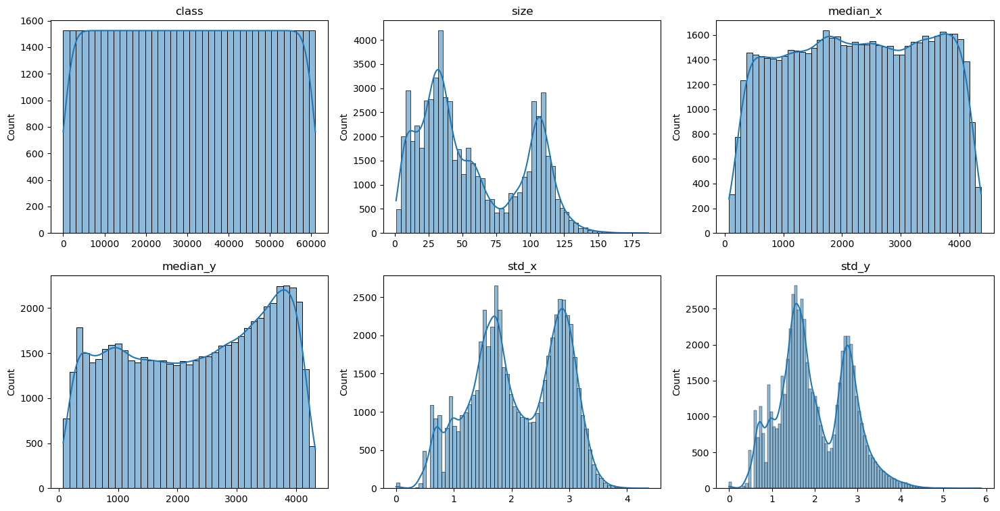

In [7]:
fig, axes = plt.subplots(2, len(class_data.columns)//2, figsize=(18, 9))
for i, (col, ax) in enumerate(zip(class_data.columns, axes.flatten())):
    sns.histplot(class_data[col], ax=ax, kde=True)
    ax.set_title(col)

In [38]:
# Calculate nearest neighbor distances of 4 nearest neighbors
# The data consists of a 2d array where the non-zero values are the regions
# The distance should be the euclidean distance between the centroids of the regions
# The output should be a 2d array of shape (n, 4) where n is the number of regions
# The output should be the distances and the indices of the nearest neighbors

@numba.njit(fastmath=True, parallel=True)
def get_nearest_neighbors(centroids: np.ndarray):
    dists = np.zeros((centroids.shape[0], 4))
    indices = np.zeros((centroids.shape[0], 4))
    for i in numba.prange(centroids.shape[0]):
        dist = np.sqrt(np.sum((centroids - centroids[i]) ** 2, axis=1))
        sorted_indices = np.argsort(dist)[1:5]  # Skip the first one because it's the point itself
        dists[i] = dist[sorted_indices]
        indices[i] = sorted_indices
    return dists, indices.astype(np.uint32)

centroids = np.array(
    [
        class_data['median_x'].to_numpy(), 
        class_data['median_y'].to_numpy()
    ]
).T
dists, indices = get_nearest_neighbors(centroids)
print(dists, indices)
print(dists.shape, indices.shape)

[[ 5.09901951  7.28010989  9.21954446 13.41640786]
 [ 2.23606798  4.12310563  5.09901951  8.60232527]
 [13.60147051 13.89244399 16.         16.2788206 ]
 ...
 [14.4222051  18.02775638 20.         25.01999201]
 [ 2.23606798  4.47213595 12.20655562 16.1245155 ]
 [ 2.23606798  6.40312424 14.2126704  15.55634919]] [[    1     3     4     5]
 [    3     4     0     5]
 [    5     6     4     8]
 ...
 [60979 60980 60978 60954]
 [60995 60990 60981 60987]
 [60994 60990 60981 60980]]
(60996, 4) (60996, 4)


{'centroid': array([ 73, 366], dtype=uint32), 'size': 43}


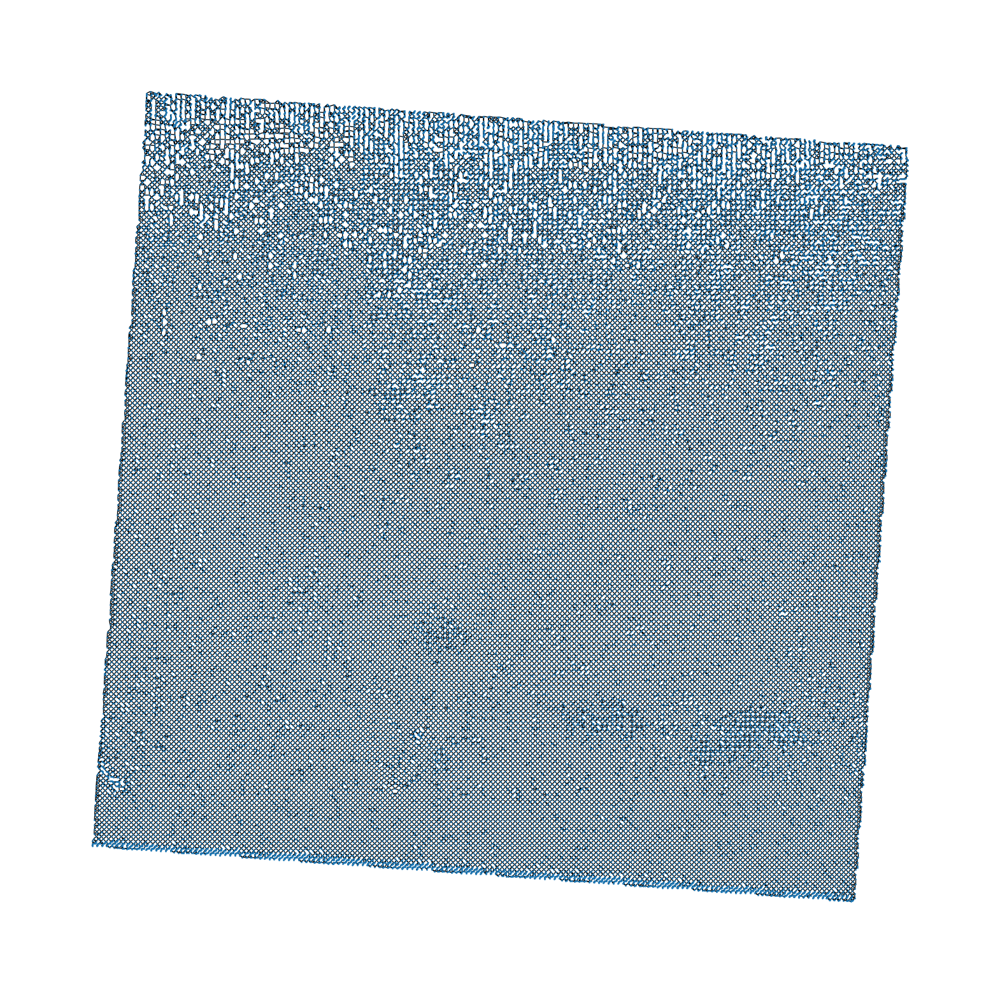

In [42]:
# Construct a graph of the regions where the nodes are the regions and the edges are the nearest neighbors
# The graph should be represented as a networkx graph, where the nodes are the region indices and the edges are the distances
# The graph should be undirected and the nodes should contain the centroid coordinates
from networkx import Graph
import networkx as nx

def construct_graph(dists, indices, centroids):
    G = Graph()
    for i, (dist, idx) in enumerate(zip(dists, indices)):
        for d, j in zip(dist, idx):
            G.add_edge(i, j, weight=d)
        G.nodes[i]['centroid'] = centroids[i]
        G.nodes[i]['size'] = class_data['size'][i]
    return G

G = construct_graph(dists, indices, centroids)
print(G.nodes[0])

# Plot the graph with the nodes colored by the region size
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_size=1, ax=ax)
plt.show()

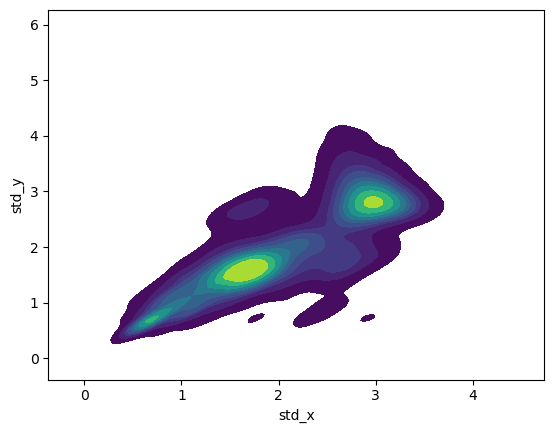

<Figure size 640x480 with 0 Axes>

In [8]:
sns.kdeplot(data=class_data, x='std_x', y='std_y', fill=True, cmap='viridis')

fig = plt.figure()

shape: (60_996, 6)
┌───────┬──────┬──────────┬──────────┬──────────┬──────────┐
│ class ┆ size ┆ median_x ┆ median_y ┆ std_x    ┆ std_y    │
│ ---   ┆ ---  ┆ ---      ┆ ---      ┆ ---      ┆ ---      │
│ u32   ┆ u32  ┆ u32      ┆ u32      ┆ f32      ┆ f32      │
╞═══════╪══════╪══════════╪══════════╪══════════╪══════════╡
│ 1     ┆ 43   ┆ 73       ┆ 366      ┆ 1.806185 ┆ 2.061782 │
│ 2     ┆ 14   ┆ 74       ┆ 371      ┆ 1.558387 ┆ 0.742307 │
│ 3     ┆ 10   ┆ 75       ┆ 391      ┆ 0.9      ┆ 0.9      │
│ 4     ┆ 13   ┆ 75       ┆ 373      ┆ 1.709701 ┆ 0.679366 │
│ 5     ┆ 11   ┆ 75       ┆ 375      ┆ 1.378705 ┆ 0.715819 │
│ …     ┆ …    ┆ …        ┆ …        ┆ …        ┆ …        │
│ 60992 ┆ 5    ┆ 4368     ┆ 3888     ┆ 0.489898 ┆ 0.748331 │
│ 60993 ┆ 5    ┆ 4370     ┆ 3914     ┆ 0.632456 ┆ 0.632456 │
│ 60994 ┆ 28   ┆ 4371     ┆ 3941     ┆ 1.533636 ┆ 1.519852 │
│ 60995 ┆ 14   ┆ 4371     ┆ 3969     ┆ 1.097306 ┆ 1.097306 │
│ 60996 ┆ 6    ┆ 4372     ┆ 3967     ┆ 0.745356 ┆ 0.745356 │
└────

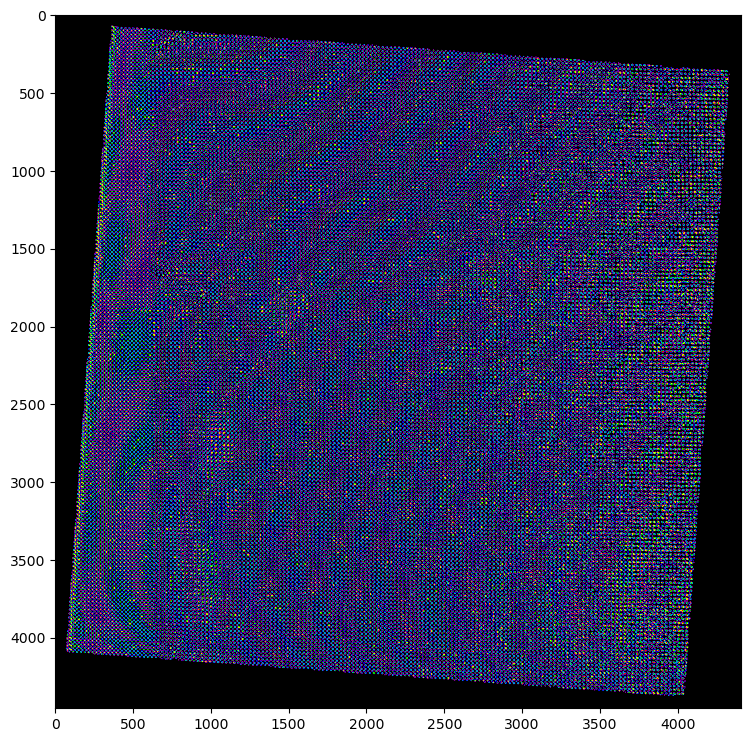

In [ ]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

print(class_data)
@numba.njit(fastmath=True, parallel=True)
def reassign_classes(org_img: np.ndarray, org_classes: np.ndarray, y_pred: np.ndarray):
    class_map = dict(zip(org_classes,y_pred))
    class_map[0] = 0
    output = np.zeros_like(org_img)

    n_row, n_col = org_img.shape
    for row_i in numba.prange(n_row):
        for col_i in numba.prange(n_col):
            output[row_i][col_i] = class_map[org_img[row_i][col_i]]
    return output

# Cluster the data
feats = ['std_x', 'std_y', 'size']#, 'median_x', 'median_y']
# y_pred = KMeans(n_clusters=2, random_state=42).fit_predict(class_data[feats]) + 1
y_pred = GaussianMixture(n_components=2, random_state=42).fit_predict(class_data[feats]) + 1
# y_pred = class_data['size'].to_numpy() > 50
# y_pred = y_pred.astype(np.uint32) + 1
org_img = images[0]['pruned'].astype(np.uint32)
org_classes = class_data['class'].to_numpy()

new_labels = reassign_classes(
    org_img, 
    org_classes, 
    y_pred
)
print(np.unique(new_labels))

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(9, 9))
ax.imshow(new_labels, cmap='nipy_spectral')

cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(new_labels))))
colored_new_labels = np.array([cm[label] for label in new_labels])
colored_new_labels = (colored_new_labels * 255).astype(np.uint8)  # Convert to uint8

img = Image.fromarray(colored_new_labels)
img.save(f"sample_{0}_gmm.png")

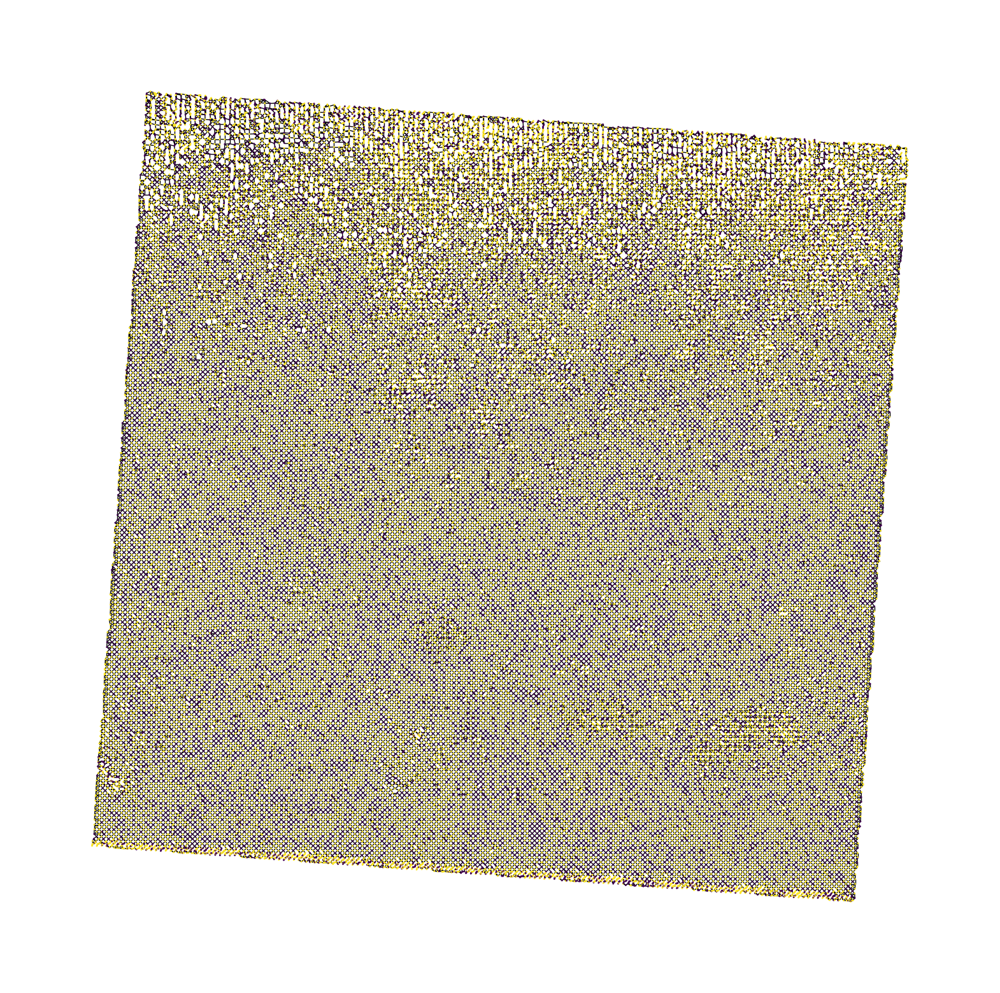

In [43]:
# Plot the graph colored by the new classes
G = construct_graph(dists, indices, centroids)
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_color=y_pred, node_size=1, ax=ax)
plt.show()

[0 1 2]


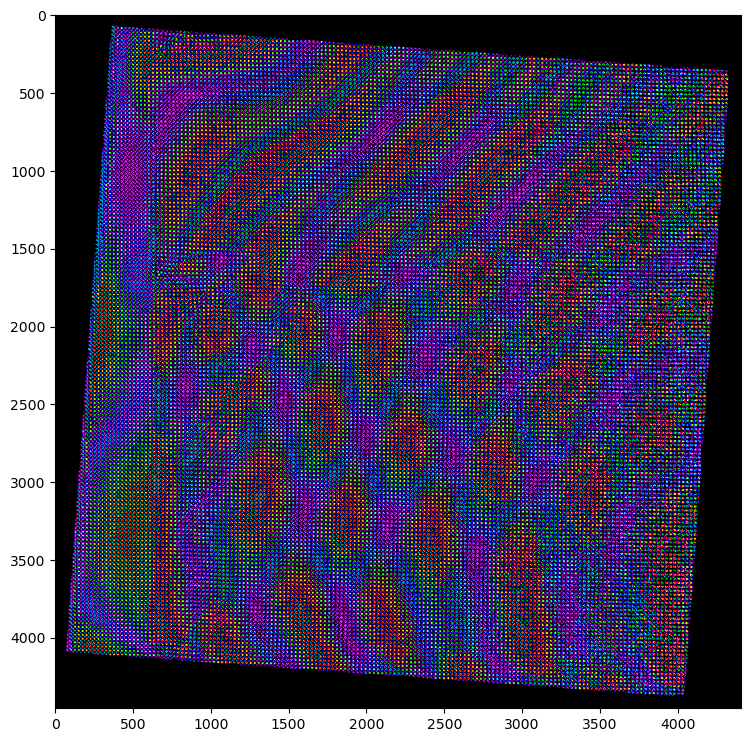

In [16]:
# Manual thresholding
x_var = class_data['std_x'].to_numpy() > 2.3
y_var = class_data['std_y'].to_numpy() > 2.3
y_pred = x_var & y_var
y_pred = y_pred.astype(np.uint32) + 1

org_img = images[0]['pruned'].astype(np.uint32)
org_classes = class_data['class'].to_numpy()

new_labels = reassign_classes(
    org_img, 
    org_classes, 
    y_pred
)
print(np.unique(new_labels))

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(9, 9))
ax.imshow(new_labels, cmap='nipy_spectral')

cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(new_labels))))
colored_new_labels = np.array([cm[label] for label in new_labels])
colored_new_labels = (colored_new_labels * 255).astype(np.uint8)  # Convert to uint8

img = Image.fromarray(colored_new_labels)
img.save(f"sample_{0}_x_std.png")